# Mixed layer depth in ACCESS models and observations

Related issue: https://github.com/ACCESS-Community-Hub/access-om3-paper-1/issues/38

Requires access to `/g/data/av17`

In [ ]:
# Parameters – this is the ONLY place you should edit
# when switching models / experiments / obs datasets.

### USER EDIT start

# ESM datastore (model output) – change this for a different run/model
# esm_file = "/g/data/zv30/non-cmip/ACCESS-CM3/cm3-run-11-08-2025-25km-beta-om3-new-um-params/cm3-demo-datastore/cm3-demo-datastore.json" #CM3 datastore
esm_file = "/g/data/ol01/outputs/access-om3-25km/MC_25km_jra_iaf-1.0-beta-5165c0f8/datastore.json"

# What physical field you want, in CF terms (stays the same across models)
variable_standard_name = "Ocean Mixed Layer Thickness Defined by Sigma T"

# Fallback variable name to use if the catalog doesn’t expose standard_name
fallback_variable_names = ["mlotst", "mld", "mixed_layer_depth", "mixed_layer_thickness"]

# Frequency depends on the datastore you’re using:
data_frequency = "1mon"

# Optional special-case switches (e.g. 25 km quirks)
APPLY_OBS_25KM_Y_SLICE = False

# Plot settings
dpi = 300

### USER EDIT stop

import os
import sys
from matplotlib import rcParams

# Change working directory to the notebooks folder in the repo
project_root = f"/g/data/{os.environ['PROJECT']}/{os.environ['USER']}/access-om3-paper-1"
notebooks_dir = os.path.join(f"/g/data/{os.environ['PROJECT']}/{os.environ['USER']}/access-om3-paper-1", "notebooks")

# This makes CWD match where SST.ipynb and exptdata_access.py live
os.chdir(notebooks_dir)
print("Changed working directory to:", os.getcwd())

from exptdata_access import get_experiment_info, guess_experiment_from_esm_file
from model_agnostic import get_lon_lat_from_catalog, select_variable

%matplotlib inline
rcParams["figure.dpi"] = dpi

plotfolder=f"/g/data/{os.environ['PROJECT']}/{os.environ['USER']}/access-om3-paper-1/notebooks/"
os.makedirs(plotfolder, exist_ok=True)

# needed for mkmd START 
notebook_name='not_using_mkfigs.sh'
os.makedirs(notebooks_dir, exist_ok=True)
os.chdir(notebooks_dir)
print("Changed working directory to:", os.getcwd())
from mkfigs_configdoc import mkmd,get_notebook_name
notebook_name=get_notebook_name(notebook_name)
## example usage (note if the first argument to mkmd remains the same, you can insert multiple figures from the same notebook): 
#if notebook_name!='not_using_mkfigs.sh': plt.savefig(plotfolder+'mkmd/'+notebook_name[:-6]+'1.png', dpi=300, bbox_inches='tight')
#if notebook_name!='not_using_mkfigs.sh': mkmd("Template notebook","`"+notebook_name+"`: Example figure 1 of ACCESS-OM3 sea surface height (m).",os.path.basename(os.path.dirname(esm_file)),notebook_name[:-6]+'1.png',plotfolder+'mkmd/')
#if notebook_name!='not_using_mkfigs.sh': mkmd("Template notebook","`"+notebook_name+"`: Example figure 2 of ACCESS-OM3 sea surface height (m).",os.path.basename(os.path.dirname(esm_file)),notebook_name[:-6]+'2.png',plotfolder+'mkmd/')
# needed for mkmd STOP

# Infer model information from the datastore path
expt_key, info = guess_experiment_from_esm_file(esm_file)

model_name = info["model"]             # OM3 or CM3

print(f"Running notebook for model: {model_name}")
print("ESM datastore path:", esm_file)
print("Plot folder path:", plotfolder)

Changed working directory to: /g/data/tm70/cyb561/access-om3-paper-1/notebooks
Changed working directory to: /g/data/tm70/cyb561/access-om3-paper-1/notebooks
Notebook name is: not_using_mkfigs.sh
Running notebook for model: ACCESS-OM3
ESM datastore path: /g/data/ol01/outputs/access-om3-25km/MC_25km_jra_iaf-1.0-beta-5165c0f8/datastore.json
Plot folder path: /g/data/tm70/cyb561/access-om3-paper-1/notebooks/


In [2]:
import xarray as xr
import cf_xarray as cfxr
import cf_xarray.units
import pint_xarray
from pint import application_registry as ureg
import intake
import cartopy.crs as ccrs
import matplotlib.pyplot as plt
from distributed import Client
import cftime
import os
import matplotlib.pyplot as plt
import cmocean as cm
import cartopy.crs as ccrs
import cartopy.feature as cft
from textwrap import wrap
xr.set_options(keep_attrs=True);  # cf_xarray works best when xarray keeps attributes by default

In [3]:
client = Client(threads_per_worker=1)
client

Connection method: Cluster object,Cluster type: distributed.LocalCluster
Dashboard: /proxy/8787/status,
Dashboard: /proxy/8787/status,Workers: 28
Total threads: 28,Total memory: 125.19 GiB
Status: running,Using processes: True
Comm: tcp://127.0.0.1:41233,Workers: 0
Dashboard: /proxy/8787/status,Total threads: 0
Started: Just now,Total memory: 0 B
Comm: tcp://127.0.0.1:43435,Total threads: 1
Dashboard: /proxy/36107/status,Memory: 4.47 GiB
Nanny: tcp://127.0.0.1:39231,


### Define plot function

In [4]:
blue_marble = plt.imread('/g/data/ik11/grids/BlueMarble.tiff')
blue_marble_extent = (-180, 180, -90, 90)

In [5]:
def plot(dat, title=None, **kwargs):
    if title is None:
        title = dat.attrs['long_name']
    fig = plt.figure(figsize=(12, 6))
    ax = plt.axes(projection=ccrs.Robinson(central_longitude=-100))
    dat.plot.contourf(
        ax=ax,
        transform=ccrs.PlateCarree(),
        cbar_kwargs={"label": "\n".join(wrap(f"{dat.attrs['long_name']} [{dat.attrs['units']}]", 45)),
                     "fraction": 0.03, "aspect": 15, "shrink": 0.7},
        **kwargs
    )
    
    # Add blue marble land:
    ax.imshow(
        blue_marble, extent=blue_marble_extent, transform=ccrs.PlateCarree(), origin="upper"
    )
    
    plt.title(title);

In [6]:
def seasonal_mean(da, months):
    # Select months, then do time-weighted mean
    da_m = da.where(da["time"].dt.month.isin(months), drop=True)
    w_m  = w.where(da["time"].dt.month.isin(months), drop=True)
    return da_m.weighted(w_m).mean("time")

### Load and plot data from ACCESS-OM3

In [7]:
exptname=os.path.basename(os.path.dirname(esm_file))
print("Experiment name:", exptname)

datastore = intake.open_esm_datastore(
    esm_file,
    columns_with_iterables=[
        "variable",
        "variable_long_name",
        "variable_standard_name",
        "variable_cell_methods",
        "variable_units"
    ]
)

Experiment name: MC_25km_jra_iaf-1.0-beta-5165c0f8


In [8]:
da_model = select_variable(
    datastore,
    variable_standard_name,
    fallback_variable_names,
    data_frequency=data_frequency,
)
print("Selected variable:", da_model.name)
print("dims:", da_model.dims)

CF-based lookup failed: ValueError('No entries found for this CF standard_name.')


/g/data/xp65/public/apps/med_conda/envs/analysis3-26.02/lib/python3.11/site-packages/intake_esm/core.py:321: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  records = grouped.get_group(internal_key).to_dict(orient='records')


Selected variable via fallback name: mlotst
Selected variable: mlotst
dims: ('time', 'yh', 'xh')


In [9]:
# Discover lon/lat from the catalog (using the helper we wrote earlier)
lon, lat = get_lon_lat_from_catalog(datastore)

# Ensure model_all has CF longitude/latitude coords
try:
    # If CF coords already exist, just use them
    _ = da_model.cf["longitude"]
    _ = da_model.cf["latitude"]
    model_all = da_model
    print("Using existing CF longitude/latitude on da_model.")
except KeyError:
    # Otherwise, attach the lon/lat we discovered
    model_all = da_model.cf.assign_coords(
        {
            "longitude": lon,
            "latitude": lat,
        }
    )
    print("Attached longitude/latitude from catalog grid variables.")

print("model_all dims:", model_all.dims)

/g/data/xp65/public/apps/med_conda/envs/analysis3-26.02/lib/python3.11/site-packages/intake_esm/core.py:321: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  records = grouped.get_group(internal_key).to_dict(orient='records')
/g/data/xp65/public/apps/med_conda/envs/analysis3-26.02/lib/python3.11/site-packages/intake_esm/core.py:321: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  records = grouped.get_group(internal_key).to_dict(orient='records')


Using existing CF longitude/latitude on da_model.
model_all dims: ('time', 'yh', 'xh')


In [10]:
averaging_mode = "last_n_years"   # or "full_period" / "fixed_period"
averaging_last_n_years = 10
averaging_start_date = None
averaging_end_date   = None

In [11]:
if exptname == "25km-iaf-test-for-AK-expt-7df5ef4c":
    model_all = model_all.isel(yh=slice(10, None))
    lon = lon.isel(yh=slice(10, None))
    lat = lat.isel(yh=slice(10, None))

In [20]:
# Put model time axis on a common calendar
model_all = model_all.convert_calendar("proleptic_gregorian", use_cftime=True)

# Inspect full time coverage
t0 = model_all.time.values[0]
t1 = model_all.time.values[-1]
print("Full model time range:", t0, "→", t1)

# Decide the averaging window based on configuration
if averaging_mode == "full_period":
    datestart = t0
    datestop = t1

elif averaging_mode == "last_n_years":
    datestop = t1
    # Subtract N years in a calendar-aware way
    datelist = list(cftime.to_tuple(datestop))
    datelist[0] -= averaging_last_n_years
    datestart = cftime.datetime(*datelist, calendar=datestop.calendar)

elif averaging_mode == "fixed_period":
    if averaging_start_date is None or averaging_end_date is None:
        raise ValueError(
            "averaging_mode='fixed_period' requires averaging_start_date and averaging_end_date"
        )
    # Use cftime to create start/end on the same calendar
    datestart = xr.cftime_range(
        start=averaging_start_date,
        periods=1,
        calendar="proleptic_gregorian",
    )[0]
    datestop = xr.cftime_range(
        start=averaging_end_date,
        periods=1,
        calendar="proleptic_gregorian",
    )[0]
else:
    raise ValueError(f"Unknown averaging_mode: {averaging_mode!r}")

timerange = slice(datestart, datestop)
print("Averaging window:", timerange)

# Restrict model to this configured window
model_window = model_all.cf.sel(time=timerange)
print("Windowed dims:", model_window.dims)

Full model time range: 1958-01-16 12:00:00 → 2014-12-16 12:00:00
Averaging window: slice(cftime.datetime(2004, 12, 16, 12, 0, 0, 0, calendar='proleptic_gregorian', has_year_zero=True), cftime.DatetimeProlepticGregorian(2014, 12, 16, 12, 0, 0, 0, has_year_zero=True), None)
Windowed dims: ('time', 'yh', 'xh')


In [21]:
# weights = days in each timestep's month
w = model_window["time"].dt.days_in_month

In [22]:
%%time
model_JFM_mean = seasonal_mean(model_window, [1, 2, 3]).compute()
model_JAS_mean = seasonal_mean(model_window, [7, 8, 9]).compute()

CPU times: user 6.93 s, sys: 577 ms, total: 7.5 s
Wall time: 7.66 s


In [23]:
model_JFM_mean

<xarray.DataArray 'mlotst' (yh: 1152, xh: 1440)> Size: 13MB
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Coordinates:
  * yh       (yh) float64 9kB -81.58 -81.52 -81.45 -81.39 ... 89.74 89.84 89.95
  * xh       (xh) float64 12kB -279.9 -279.6 -279.4 -279.1 ... 79.38 79.62 79.88
Attributes:
    units:          m
    long_name:      Ocean Mixed Layer Thickness Defined by Sigma T
    cell_methods:   area:mean yh:mean xh:mean time: mean
    cell_measures:  area: areacello
    time_avg_info:  average_T1,average_T2,average_DT
    standard_name:  ocean_mixed_layer_thickness_defined_by_sigma_t

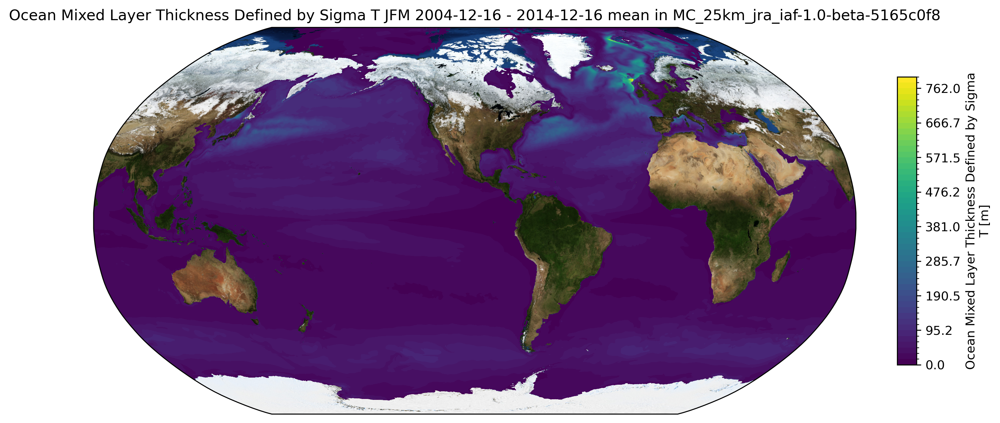

In [24]:
plot(model_JFM_mean,
    levels=51,
    vmin=0,
    vmax=None,
    # extend="max",
    cmap='viridis',
    title=f"{model_window.attrs['long_name']} JFM {model_window.time.values[0].strftime('%Y-%m-%d')} - {model_window.time.values[-1].strftime('%Y-%m-%d')} mean in {exptname}"
    )
if notebook_name!='not_using_mkfigs.sh': plt.savefig(plotfolder+'mkmd/'+notebook_name[:-6]+'1.png', dpi=300, bbox_inches='tight')
if notebook_name!='not_using_mkfigs.sh': mkmd("Mixed Layer Depth","`"+notebook_name+"`: Ocean Mixed Layer Thickness JFM.",os.path.basename(os.path.dirname(esm_file)),notebook_name[:-6]+'1.png',plotfolder+'mkmd/')

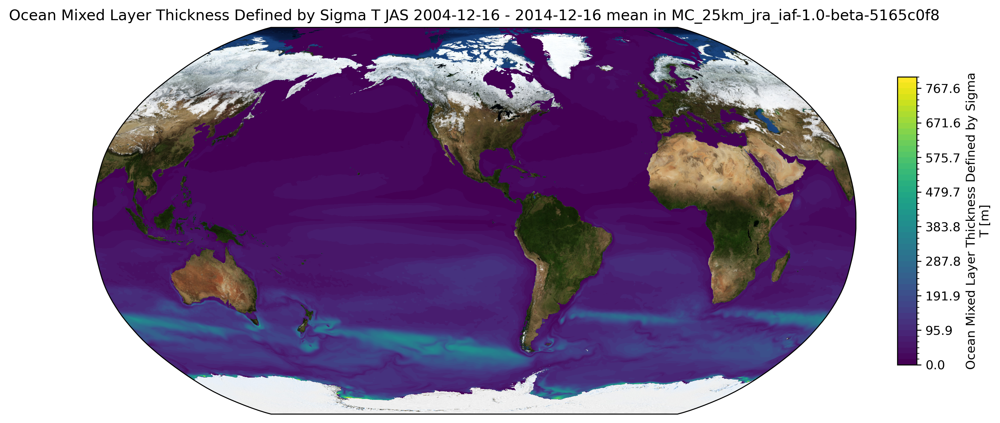

In [25]:
plot(model_JAS_mean,
    levels=51,
    vmin=0,
    vmax=None,
    # extend="max",
    cmap='viridis',
    title=f"{model_window.attrs['long_name']} JAS {model_window.time.values[0].strftime('%Y-%m-%d')} - {model_window.time.values[-1].strftime('%Y-%m-%d')} mean in {exptname}"
    )
if notebook_name!='not_using_mkfigs.sh': plt.savefig(plotfolder+'mkmd/'+notebook_name[:-6]+'2.png', dpi=300, bbox_inches='tight')
if notebook_name!='not_using_mkfigs.sh': mkmd("Mixed Layer Depth","`"+notebook_name+"`: Ocean Mixed Layer Thickness JAS.",os.path.basename(os.path.dirname(esm_file)),notebook_name[:-6]+'2.png',plotfolder+'mkmd/')

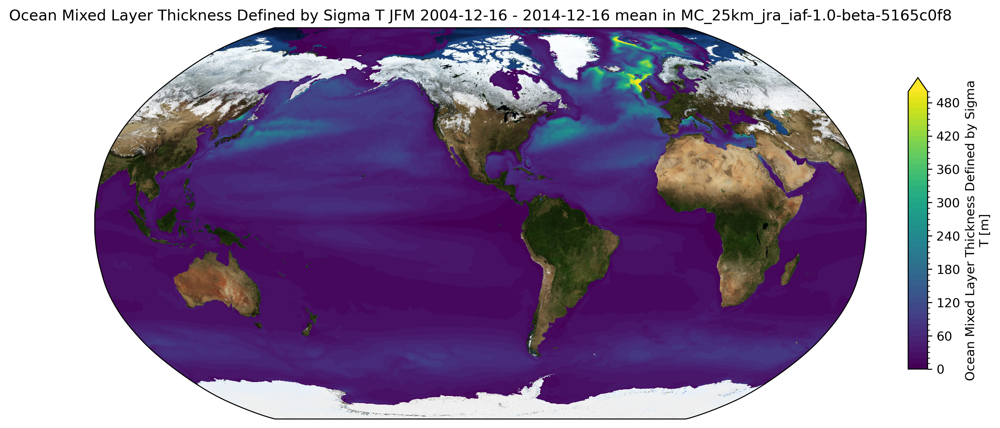

In [26]:
plot(model_JFM_mean,
    levels=51,
    vmin=0,
    vmax=500,
    extend="max",
    cmap='viridis',
    title=f"{model_window.attrs['long_name']} JFM {model_window.time.values[0].strftime('%Y-%m-%d')} - {model_window.time.values[-1].strftime('%Y-%m-%d')} mean in {exptname}"
    )
if notebook_name!='not_using_mkfigs.sh': plt.savefig(plotfolder+'mkmd/'+notebook_name[:-6]+'3.png', dpi=300, bbox_inches='tight')
if notebook_name!='not_using_mkfigs.sh': mkmd("Mixed Layer Depth","`"+notebook_name+"`: Ocean Mixed Layer Thickness JFM.",os.path.basename(os.path.dirname(esm_file)),notebook_name[:-6]+'3.png',plotfolder+'mkmd/')

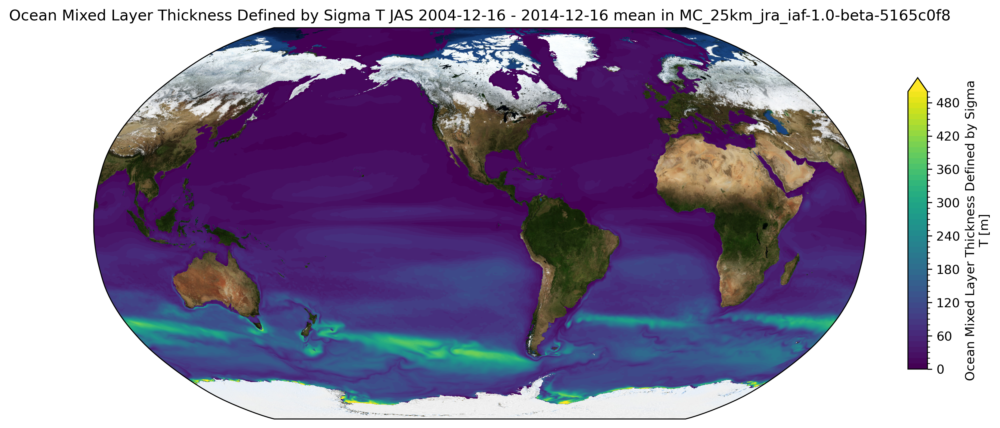

In [27]:
plot(model_JAS_mean,
    levels=51,
    vmin=0,
    vmax=500,
    extend="max",
    cmap='viridis',
    title=f"{model_window.attrs['long_name']} JAS {model_window.time.values[0].strftime('%Y-%m-%d')} - {model_window.time.values[-1].strftime('%Y-%m-%d')} mean in {exptname}"
    )


if notebook_name!='not_using_mkfigs.sh': plt.savefig(plotfolder+'mkmd/'+notebook_name[:-6]+'4.png', dpi=300, bbox_inches='tight')
if notebook_name!='not_using_mkfigs.sh': mkmd("Mixed Layer Depth","`"+notebook_name+"`: Ocean Mixed Layer Thickness JAS.",os.path.basename(os.path.dirname(esm_file)),notebook_name[:-6]+'4.png',plotfolder+'mkmd/')

### Load and plot obs data from DeBoyer Montegut (2023)
https://doi.org/10.17882/91774

In [20]:
MLDobs = xr.open_dataset('/g/data/av17/access-nri/OM3/MLD-DeBoyerMontegut2023/mld_dr003_ref10m_v2023.nc')['mld_dr003']
MLDobs.attrs['units'] = MLDobs.attrs['unit']  # fix so plot works

# TODO: append copy of westernmost data to eastern end to avoid gap in plot

In [21]:
# small BUG: mean of monthly means is not mean of days in that month (eg Feb gets slightly more heavily weighted)
MLDobs_JFM_mean = MLDobs.isel(time=[0, 1, 2]).mean('time').load()
MLDobs_JAS_mean = MLDobs.isel(time=[6, 7, 8]).mean('time').load()

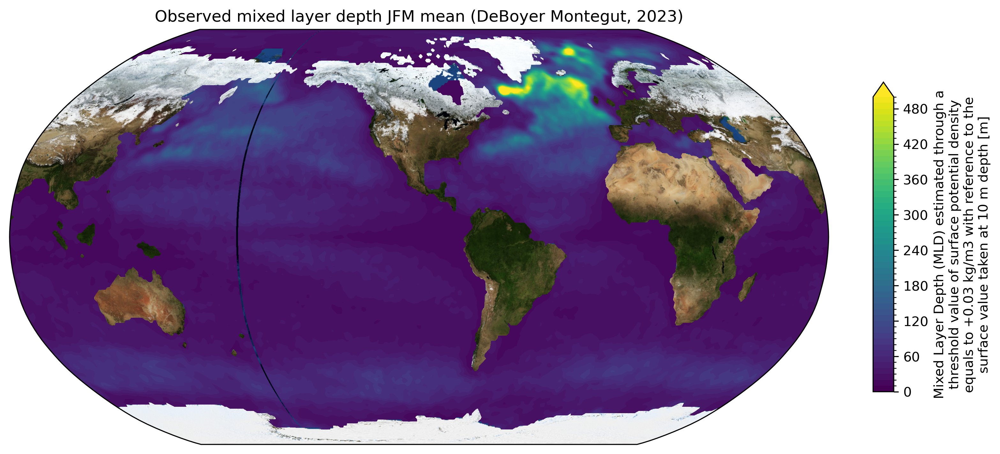

In [22]:
plot(MLDobs_JFM_mean,
    levels=51,
    vmin=0,
    vmax=500,
    extend="max",
    cmap='viridis',
    title=f"Observed mixed layer depth JFM mean (DeBoyer Montegut, 2023)"
    )
if notebook_name!='not_using_mkfigs.sh': plt.savefig(plotfolder+'mkmd/'+notebook_name[:-6]+'5.png', dpi=300, bbox_inches='tight')
if notebook_name!='not_using_mkfigs.sh': mkmd("Mixed Layer Depth","`"+notebook_name+"`: Observed mixed layer depth JFM.",os.path.basename(os.path.dirname(esm_file)),notebook_name[:-6]+'5.png',plotfolder+'mkmd/')

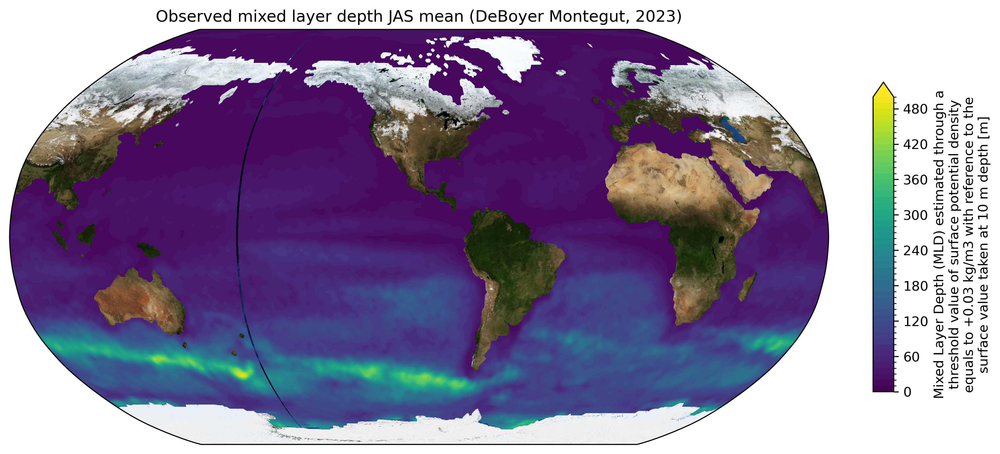

In [23]:
plot(MLDobs_JAS_mean,
    levels=51,
    vmin=0,
    vmax=500,
    extend="max",
    cmap='viridis',
    title=f"Observed mixed layer depth JAS mean (DeBoyer Montegut, 2023)"
    )
if notebook_name!='not_using_mkfigs.sh': plt.savefig(plotfolder+'mkmd/'+notebook_name[:-6]+'6.png', dpi=300, bbox_inches='tight')
if notebook_name!='not_using_mkfigs.sh': mkmd("Mixed Layer Depth","`"+notebook_name+"`: Observed mixed layer depth JAS.",os.path.basename(os.path.dirname(esm_file)),notebook_name[:-6]+'6.png',plotfolder+'mkmd/')

In [24]:
client.close()